# Text to Speech

When solving some problem with deep learning in practice, you search the Web for the latest paper that solves that task, and take its implementation from GitHub. However, often there is no code, so being able to **reimplement a paper** is a vital skill. You will likely have to do it in your course project, and we are going to practice it in this assignment.

Let's focus on the task of text-to-speech (**TTS**) synthesis.

![](https://user-images.githubusercontent.com/9570420/81783573-392ed600-9504-11ea-98da-86ac05457c29.png)

## Data

 Intuitively, in the real world your dataset would be a set of pairs:

* text (string);
* **target**: raw audio of a person saying `text` (array of amplitude values sampled e.g. 44100 times per second — see an example plotted above).

We give you a simplified problem statement, with one dataset sample being an utterance described by

* list of [ARPAbet phonemes](http://www.speech.cs.cmu.edu/cgi-bin/cmudict#phones);
* *phoneme alignment*, i.e. start time (frame) and duration for each phoneme;
* **target**: [mel spectrogram](https://pytorch.org/audio/transforms.html#torchaudio.transforms.MelSpectrogram) of a person saying text.

![image](https://user-images.githubusercontent.com/9570420/81795777-2a9cea80-9515-11ea-99eb-05915f803af1.png)

In [0]:
import scipy.io.wavfile

import torch
import numpy as np

from matplotlib import pyplot as plt
%matplotlib inline

import random
from pathlib import Path

seed = 0
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True

In [4]:
# Detect if we are in Google Colaboratory
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

from pathlib import Path
# Determine the locations of auxiliary libraries and datasets.
# `AUX_DATA_ROOT` is where 'notmnist.py', 'animation.py' and 'tiny-imagenet-2020.zip' are.
if IN_COLAB:
    google.colab.drive.mount("/content/drive")
    
    # Change this if you created the shortcut in a different location
    AUX_DATA_ROOT = Path("/content/drive/My Drive/Deep Learning 2020 -- Home Assignment 4")
    
    assert AUX_DATA_ROOT.is_dir(), "Have you forgotten to 'Add a shortcut to Drive'?"
    
    import sys
    sys.path.insert(0, str(AUX_DATA_ROOT))
else:
    AUX_DATA_ROOT = Path(".")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [8]:
![ ! -d "LJ-Speech-aligned" ] && unzip -q "{AUX_DATA_ROOT / 'LJ-Speech-aligned.zip'}"
!git clone --recursive https://github.com/shrubb/waveglow.git -b denoiser-fix
!wget -c https://api.ngc.nvidia.com/v2/models/nvidia/waveglow_ljs_256channels/versions/2/files/waveglow_256channels_ljs_v2.pt

Cloning into 'waveglow'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 179 (delta 0), reused 2 (delta 0), pack-reused 176
Receiving objects: 100% (179/179), 433.68 KiB | 610.00 KiB/s, done.
Resolving deltas: 100% (98/98), done.
Submodule 'tacotron2' (https://github.com/shrubb/tacotron2.git) registered for path 'tacotron2'
Cloning into '/content/waveglow/tacotron2'...
remote: Enumerating objects: 399, done.        
remote: Total 399 (delta 0), reused 0 (delta 0), pack-reused 399        
Receiving objects: 100% (399/399), 2.69 MiB | 2.13 MiB/s, done.
Resolving deltas: 100% (202/202), done.
Submodule path 'tacotron2': checked out 'ed0f02bda932e6ab17f8f4b034ac26767a6a7a50'
--2020-05-24 18:29:26--  https://api.ngc.nvidia.com/v2/models/nvidia/waveglow_ljs_256channels/versions/2/files/waveglow_256channels_ljs_v2.pt
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 35.161.182.61, 52.89.201.137

Use this Python module to handle our dataset. It's documented, so when in doubt, use `help()` or read the code with `??lj_speech`.

In [9]:
!pip install git+https://github.com/shrubb/listener.git

  Cloning https://github.com/shrubb/listener.git to /tmp/pip-req-build-s95vshp_
  Running command git clone -q https://github.com/shrubb/listener.git /tmp/pip-req-build-s95vshp_
  Created wheel for listener: filename=listener-1.0.0a1-cp36-none-any.whl size=87098 sha256=94b3fe3bb840ab54c2dfa613858a63c69a232107999226da948bb053f5b4be8a
  Stored in directory: /tmp/pip-ephem-wheel-cache-qtkm54lc/wheels/41/ec/98/7c89227ba5da35ff1e7d5284bb58e0b98e93389fc1f77c407b
Successfully built listener


In [0]:
import lj_speech

In [0]:
DATASET_ROOT = Path('LJ-Speech-aligned/')

train_dataset, val_dataset = lj_speech.get_dataset(DATASET_ROOT)

There are also a couple of useful constants, check them with `?lj_speech`.

In [0]:
# lj_speech.POSSIBLE_PHONEME_CODES

Here is an example datapoint:

In [0]:
example_datapoint = train_dataset[800]
print(f"Datasets yield: {', '.join(example_datapoint.keys())}")
# plt.imshow(example_datapoint['spectrogram']);
# print([example_datapoint[key] for key in example_datapoint])
print(len(example_datapoint['text']))
print(len(example_datapoint['phonemes_start']))
print(len(example_datapoint['phonemes_duration']))
print(len(example_datapoint['phonemes_code']))

To "play" spectrograms, including those that you will generate, we will use another deep learning algorithm called [WaveGlow](https://arxiv.org/abs/1811.00002). It converts mel spectrograms to audio.

Fortunately, there *is* code for it on GitHub, so you won't have to reimplement it 🙂 Still, if you haven't done so, I encourage you to watch a short [video](https://www.youtube.com/watch?v=CqFIVCD1WWo) about a famous paper that it's based on.


In [0]:
vocoder = lj_speech.Vocoder()

In [0]:
print(example_datapoint['text'])

example_spectrogram = torch.from_numpy(example_datapoint['spectrogram'])
audio = vocoder(example_spectrogram)
lj_speech.play_audio(audio)

the chaplain's duties were enlarged, and the principle of toleration accepted to the extent of securing to all prisoners


Finally, we have phonemes as inputs, but we'd like to synthesize arbitrary text. For that, there is a function `lj_speech.text_to_phonemes(text)`.

In [0]:
# lj_speech.text_to_phonemes('what a good day. it seems as the pandemic has a positive effect on the nature')

## Method

Reimplement the baseline method defined by the diagram below. It's derived from a simplified version of the [DurIAN paper](https://arxiv.org/abs/1909.01700).

Just in case, here are some of the most notable differences from DurIAN:
* Prosodic boundary markers aren't used (we don't have them labeled), and thus there's no 'skip states' exclusion of prosodic boundaries' hidden states.
* Style codes aren't used too (same).
* Simpler network architectures.
* No pre-net in decoder.
* No attention used in decoder.
* Decoder's recurrent cell outputs single spectrogram frame at a time.
* Decoder's recurrent cell isn't conditioned on its own outputs (isn't "autogressive").

![pipeline](https://user-images.githubusercontent.com/9570420/81863803-6f0ba300-9574-11ea-9f02-481c2bba81f0.png)

This picture is the simplified Figure 1 from the paper. **Use the paper as a reference**. If something is unclear from the diagram — and, in fact, some things are intentionally omitted — search answers in the paper (but remain aware of the differences/simplifications in the above diagram) and other papers that the authors cite. There will even be details that aren't even mentioned anywhere in the paper, so you'll have to guess by your intuition. For instance, DurIAN paper doesn't explain batch size and sampling strategy, and even if it did, it would be irrelevant since we use different data. Finally, search the Web and read others' code; however, if you copy-paste code, **cite it**.

Tips:
* Only compute loss on the 'original' parts of the spectrograms (don't include padding)!
* When using recurrent nets, [clip gradients' norm](https://pytorch.org/docs/stable/nn.html#torch.nn.utils.clip_grad_norm_).
* Since you will use recurrent nets, and the sequences in a batch will be of different lengths, you may find [sequence packing utility](https://stackoverflow.com/questions/51030782/why-do-we-pack-the-sequences-in-pytorch) useful.
* Remember that you can send images and audio into TensorBoard, too.

**Train this baseline so that the words are well-recognizable, and try to get rid of the "metallic", "tin sounding" voice.**

**Aim for something like this:**

In [0]:
lj_speech.play_audio(scipy.io.wavfile.read(AUX_DATA_ROOT / 'ok.wav')[1])

**On the other hand, here is an example of insufficient quality:**

In [0]:
lj_speech.play_audio(scipy.io.wavfile.read(AUX_DATA_ROOT / 'bad.wav')[1])

In [0]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch import nn
from torchsummary import summary
import torch
import torchtext
import torchtext.datasets
import torchtext.data

In [0]:
def my_collate(batch):


    texts = []
    bs = len(batch)
    max_ph_len= 137 
    max_spec_len = 920

    spectrograms = torch.ones((bs,80,max_spec_len))*(-100)
    
    phonemes = torch.ones((bs, max_ph_len))*27 ##
    phonemes_start = torch.zeros((bs, max_ph_len))
    phonemes_duration = torch.ones((bs, max_ph_len))
    mask = torch.ones((bs,80,max_spec_len))

    for batch_index, sample in enumerate(batch):
        for i, phoneme in enumerate(sample['phonemes_code']):
            phonemes[batch_index][i] = (list(lj_speech.POSSIBLE_PHONEME_CODES).index(phoneme))
        
        texts.append(sample['text'])

        spectrogram_buf = torch.from_numpy(sample['spectrogram']).type(torch.float32)
        spectrograms[batch_index, :, :spectrogram_buf.shape[1]] = spectrogram_buf
        mask[batch_index, :, spectrogram_buf.shape[1]:] = torch.zeros(80, max_spec_len - spectrogram_buf.shape[1])

        phonemes_start[batch_index, :i+1] = torch.FloatTensor(sample['phonemes_start'])
        
        phonemes_duration[batch_index, :i+1] = torch.FloatTensor(sample['phonemes_duration'])
        summ = torch.sum(phonemes_duration[batch_index]) 
        phonemes_duration[batch_index, -1] = max_spec_len - summ 

    return [texts, phonemes_start, phonemes_duration, phonemes, spectrograms, mask ]

In [0]:
dataloader_train = DataLoader(train_dataset, batch_size=64, shuffle=True, collate_fn=my_collate, num_workers=8)
dataloader_val = DataLoader(val_dataset, batch_size=64, shuffle=True, collate_fn=my_collate, num_workers=8)

In [0]:
# for test_batch  in dataloader_train:
#     durations   = test_batch[2]
#     for i in durations:
#         if i[-1]<0 :print(i[-1])

## Modules



In [0]:
class Convresidual(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.5):
        super().__init__()

        self.strim = nn.Sequential(
              nn.Conv1d(in_channels, out_channels, kernel_size=5, padding=2),
              nn.ReLU(),
              nn.BatchNorm1d(out_channels),
              nn.Dropout(dropout)       
        )
        self.res = nn.Conv1d(in_channels, out_channels, kernel_size=1 )
    def forward(self, x):
        return self.strim(x) + self.res(x)
         

class Encoder(nn.Module):

    def __init__(self, n_tokens=137, hid_dim = 256):
        super().__init__()
        self.embed = nn.Embedding(n_tokens, hid_dim)
        self.convs = nn.ModuleList([
              Convresidual(hid_dim, hid_dim),
              Convresidual(hid_dim, hid_dim),
              Convresidual(hid_dim, hid_dim*2),
              Convresidual(hid_dim*2, hid_dim*2),
              Convresidual(hid_dim*2, hid_dim*2),                        
        ])

        self.gru = nn.GRU(hid_dim*2, hid_dim, batch_first=True, bidirectional=True)
    def forward(self, x):
        x = self.embed(x)
        x = x.transpose(1, 2)
        for l in self.convs:
            x = l(x)
        x = x.transpose(1,2)
        x,_ = self.gru(x)
        return x


class Decoder(nn.Module):
    def __init__(self,hid_dim=256):
      super().__init__()
      self.gru = nn.GRU(hid_dim*2+1, hid_dim, num_layers=2, batch_first=True)
      self.conv1 = nn.Conv1d(hid_dim, 80, kernel_size=1)
      self.conv2 = nn.Conv1d(hid_dim, 80, kernel_size=1)
      self.postnet = nn.ModuleList([
            Convresidual(hid_dim, hid_dim, dropout=0),
            Convresidual(hid_dim, hid_dim, dropout=0),
            Convresidual(hid_dim, hid_dim, dropout=0),
            Convresidual(hid_dim, hid_dim, dropout=0),
            Convresidual(hid_dim, hid_dim, dropout=0),                        
      ])

    def forward(self, x):
        x,_ = self.gru(x)
        x = x.permute(0,2,1)
        spec1 = self.conv1(x)
        for l in self.postnet:
            x  = l(x)
        spec2 = self.conv2(x)
        return spec1, spec2 

       
class Duration(nn.Module):
    def __init__(self, n_tokens=137, hid_dim=256):
        super(Duration,self).__init__()
        self.embed = nn.Embedding(n_tokens, hid_dim)
        self.lstm  = nn.LSTM(hid_dim, hid_dim, num_layers=3,  bidirectional=True, batch_first=True)
        self.fc    = nn.Linear(hid_dim*2, 1)

    def forward(self, x):
        x   = self.embed(x)
        x, (hidden, cell) = self.lstm(x) 
        x   = self.fc(x).permute(0,2,1).squeeze()
        return x





class DurIAN(nn.Module):
    def __init__(self, max_phonemes_length=137, hid_dim=256, device='cpu'):
        super().__init__()
    
        self.encoder = Encoder(max_phonemes_length,hid_dim).to(device)
        self.alignmt = Alignment(device)
        self.decoder = Decoder(hid_dim).to(device)

    def forward(self, phoneme, duration):
        encod = self.encoder(phoneme)
        aligm = self.alignmt(encod, duration)
        decod = self.decoder(aligm)

        return decod


class Alignment(nn.Module):
    def __init__(self, device='cpu'):
        super().__init__()
        self.device = device
        self.running = []
        self.rows1   = torch.ones(2,512).to(device)
        self.rows2   = torch.ones(2,1).to(device)
    
    def diff (self, current):
        return torch.median(torch.tensor(self.running)) - current
        
        
        
    def forward(self, x, duration):

        bs, _, hid_dim = x.size()
        x = x.reshape(-1, hid_dim)
        duration = duration.flatten()
        x = x.repeat_interleave(duration, dim=0)
        z = torch.cat([torch.linspace(0,1, steps=i) if i>1 else torch.tensor([0.]) for i in duration.data ], dim=0).unsqueeze(1).to(self.device)
        self.running.append(x.shape[0])
        b = torch.cat([x,z], dim=1)
        try:
            b = b.reshape(bs, -1, hid_dim+1)
        except: 
            diff = self.diff(x.shape[0])
            x = torch.cat([x,self.rows1], dim=0)
            z = torch.cat([z,self.rows2], dim=0)
            d = torch.cat([x,z], dim=1)
            d = d.reshape(bs, -1, hid_dim+1)
            return d
        return b



In [82]:
torch.median(torch.tensor([1,2,3,3,4]))

tensor(3)

#### Model Seems working !!! Let's build a training loop

In [83]:
a = torch.randn(4,5)
a.shape

torch.Size([4, 5])

In [99]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.functional as F
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

for i,test_batch in enumerate(dataloader_train):

    durations    = test_batch[2].long().to(device)
    phoneme      = test_batch[3].long().to(device)
    spec_orig    = test_batch[-2].to(device)
    mask         = test_batch[-1].to(device)
    durlan = DurIAN(device=device)
    spec1, spec2 = durlan(phoneme,durations)

    print(spec1.shape)
    print(spec2.shape)
    print(spec_orig.shape)
    print(mask.shape)
    print('================================')

    criterion(spec1, spec2, spec_orig, mask)

torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([64, 80, 920])
torch.Size([64, 80, 920])
torch.Size([64, 80, 919])
torch.Size([64, 80, 919])
torch.Size([

## DurIAN Module Training

In [0]:
from  datetime import datetime
import os

def setup_experiment(title, logdir="./tb"):
    experiment_name = "{}@{}".format(title, datetime.now().strftime("%d.%m.%Y-%H:%M:%S"))
    writer = SummaryWriter(log_dir=os.path.join(logdir, experiment_name))
    best_model_path = f"{title}.best.pth"
    return writer, experiment_name, best_model_path

In [0]:
def criterion(spec1, spec2, spec_orig, mask):

    a  = torch.sum( torch.abs( spec_orig[:,:,:-1]*mask[:,:,:-1] - spec1*mask[:,:,:-1] )) 
    b  = torch.sum( torch.abs( spec_orig[:,:,:-1]*mask[:,:,:-1] - (spec1*mask[:,:,:-1] + spec2*mask[:,:,:-1]) ))
    return a+b

In [0]:
def run_epoch(model, iterator, optimizer, criterion, phase='train', epoch=0, writer=None, device='cpu'):
    is_train = (phase == 'train')
    if is_train:
        model.train()
    else:
        model.eval()
    
    epoch_loss = 0
    
    with torch.set_grad_enabled(is_train):
        for i, batch in enumerate(iterator):
            global_i = len(iterator) * epoch + i
            
            # unpack batch
            durations, phoneme = batch[2].long().to(device), batch[3].long().to(device)
            spec_orig, mask    = batch[-2].to(device), batch[-1].to(device)
      
                        
            # make prediction
            spec11, spec22 = model(phoneme,durations)
          
            
            # calculate loss
            loss = criterion(spec11, spec22, spec_orig, mask)
            
            if is_train:
                # make optimization step
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
            # dump train metrics to tensorboard
            if writer is not None and is_train:
                writer.add_scalar(f"loss/{phase}", loss.item(), global_i)
                
            epoch_loss += loss.item()

        # dump epoch metrics to tensorboard
        if writer is not None:
            writer.add_scalar(f"loss_epoch/{phase}", epoch_loss / len(iterator), epoch)

        return epoch_loss / len(iterator)

In [104]:
import torch
from torch import nn
from torch.utils.tensorboard import SummaryWriter


dataloader_train = DataLoader(train_dataset, batch_size=64, shuffle=True, collate_fn=my_collate, num_workers=8)
dataloader_val = DataLoader(val_dataset, batch_size=64, shuffle=True, collate_fn=my_collate, num_workers=8)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model  = DurIAN(device=device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# duration_scheduler = optim.lr_scheduler.StepLR(duration_optim, step_size=8, gamma=0.8)
# duration_scheduler = optim.lr_scheduler.ReduceLROnPlateau(duration_optim, 'min', verbose=True)

writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")
print(f"Experiment name: {experiment_name}")


Experiment name: DurIAN@24.05.2020-19:21:52


In [105]:
n_epochs = 2

best_val_loss = float('+inf')
for epoch in range(n_epochs): 

    train_loss = run_epoch(model, dataloader_train, optimizer, criterion, phase='train', epoch=epoch, writer=writer, device=device)
    val_loss   = run_epoch(model, dataloader_val, None, criterion, phase='val', epoch=epoch, writer=writer, device=device)

        
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    
    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f}')


Epoch: 01
	Train Loss: 22898694.510
Epoch: 02
	Train Loss: 8545622.734


In [103]:
%reload_ext tensorboard
logs_base_dir = "./tb"
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

### Train Loss for DurIAN

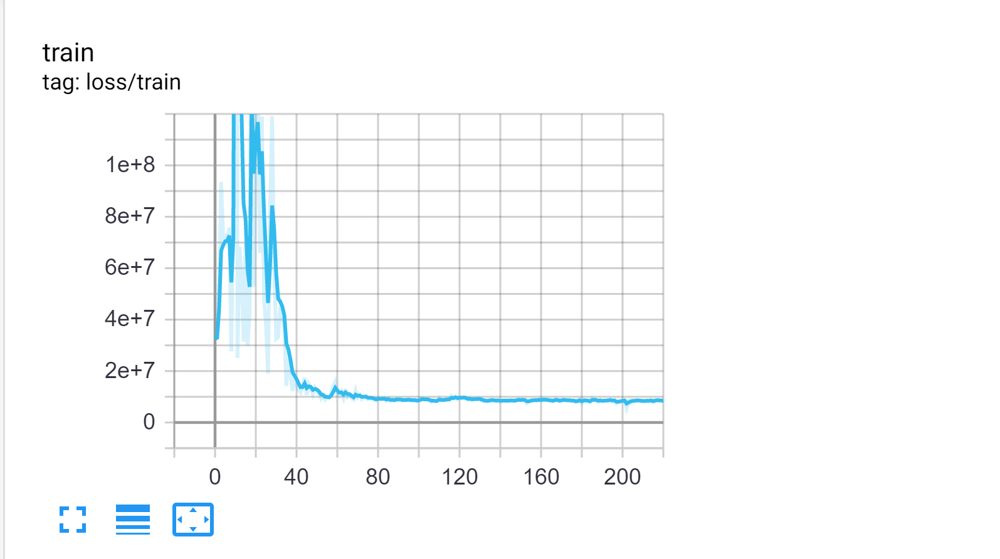

## Duration Module Training. Training loop

In [0]:
def run_epoch_duration(model, iterator, optimizer, criterion, phase='train', epoch=0, writer=None, device='cpu'):
    is_train = (phase == 'train')
    if is_train:
        model.train()
    else:
        model.eval()
    
    epoch_loss = 0
    
    with torch.set_grad_enabled(is_train):
        for i, batch in enumerate(iterator):
            global_i = len(iterator) * epoch + i
            
            # unpack batch
            durations, phoneme = batch[2].long().to(device), batch[3].long().to(device)
      
            # make prediction
            durexp = model(phoneme)

            # calculate loss
            loss = criterion( durations, durexp)
            
            if is_train:
                # make optimization step
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
            # dump train metrics to tensorboard
            if writer is not None and is_train:
                writer.add_scalar(f"loss/{phase}", loss.item(), global_i)
                
            epoch_loss += loss.item()

        # dump epoch metrics to tensorboard
        if writer is not None:
            writer.add_scalar(f"loss_epoch/{phase}", epoch_loss / len(iterator), epoch)

        return epoch_loss / len(iterator)

In [0]:

test_batch   = next(iter(dataloader_train))
    
durations    = test_batch[2].long().to(device)
phoneme      = test_batch[3].long().to(device)
spec_orig    = test_batch[-2].to(device)
mask         = test_batch[-1].to(device)

dur_model = Duration().to(device)
durexp = dur_model(phoneme)
print(durexp.shape)


torch.Size([33, 137])


In [0]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
from torch import nn
from torch.utils.tensorboard import SummaryWriter


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
dur_model = Duration().to(device)
criterion = nn.MSELoss()
optimizer  = torch.optim.Adam(dur_model.parameters(), lr=0.001)


writer, experiment_name, best_model_path = setup_experiment(dur_model.__class__.__name__, logdir="./tb_duration_module")
print(f"Experiment name: {experiment_name}")


Experiment name: Duration@24.05.2020-15:34:39


In [0]:
n_epochs = 20

best_val_loss = float('+inf')
for epoch in range(n_epochs): 

    train_loss = run_epoch_duration(dur_model, dataloader_train, optimizer, criterion, phase='train', epoch=epoch, writer=writer, device=device)
    val_loss   = run_epoch_duration(dur_model, dataloader_val, None, criterion, phase='val', epoch=epoch, writer=writer, device=device)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(dur_model.state_dict(), best_model_path)
  
    print(f'Epoch: {epoch+1:02}')
    print(f'\tTrain Loss: {train_loss:.3f}')

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:432: UserWarning: Using a target size (torch.Size([137])) that is different to the input size (torch.Size([1, 137])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 01
	Train Loss: 512.620
Epoch: 02
	Train Loss: 250.716
Epoch: 03
	Train Loss: 129.516
Epoch: 04
	Train Loss: 63.398
Epoch: 05
	Train Loss: 38.415
Epoch: 06
	Train Loss: 26.688
Epoch: 07
	Train Loss: 20.451
Epoch: 08
	Train Loss: 16.707
Epoch: 09
	Train Loss: 13.615
Epoch: 10
	Train Loss: 11.743
Epoch: 11
	Train Loss: 10.148
Epoch: 12
	Train Loss: 9.009
Epoch: 13
	Train Loss: 8.359
Epoch: 14
	Train Loss: 7.321
Epoch: 15
	Train Loss: 6.524
Epoch: 16
	Train Loss: 5.899
Epoch: 17
	Train Loss: 5.422
Epoch: 18
	Train Loss: 5.612
Epoch: 19
	Train Loss: 4.812
Epoch: 20
	Train Loss: 4.172


In [0]:
%reload_ext tensorboard
logs_base_dir = "./tb_duration_module"
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

/usr/lib/python3.6/subprocess.py:786: ResourceWarning: subprocess 12286 is still running
  ResourceWarning, source=self)


### Below are loss curves of duration module training

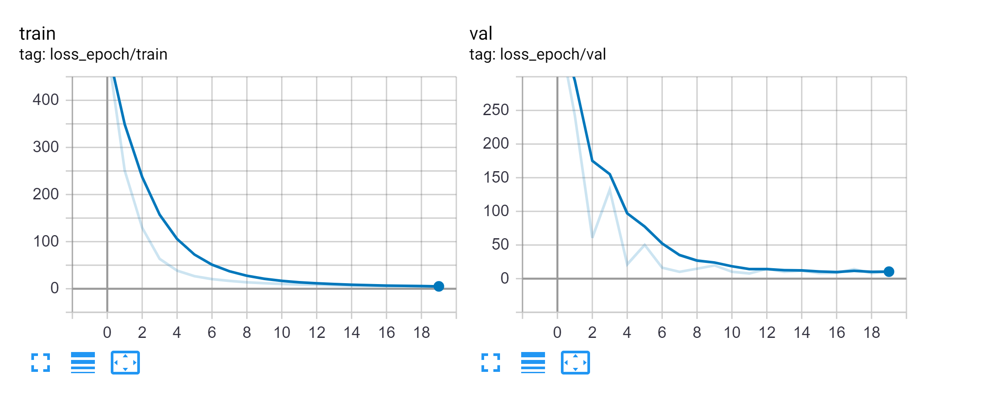

## Improving the Method

When you have the baseline working, seek the ways to improve quality and to decrease loss. Look into the paper and the relevant/neighbouring literature. Also, follow your intuition, e.g. for changing model complexity or regularization. For example, you can (but aren't obliged to) try borrowing more tricks from DurIAN; a couple of examples for inspiration:

* Make decoder recurrent cell autoregressive as in the paper: use its output as its input at the next preiction step.
* Add pre-net to decoder.
* Add attention to decoder.
* Use more complex sub-network architectures (e.g. use CBHG).
* Employ tricks from Tacotron {[1](https://arxiv.org/abs/1703.10135),[2](https://arxiv.org/abs/1712.05884)} — papers that DurIAN is based upon, e.g. [zoneout](https://arxiv.org/abs/1606.01305) in RNNs.

Write a report on your journey to better loss. Explain if you managed to perceptibly improve the quality and lower the loss, what you tried and why, what worked and what didn't. Include TensorBoard loss plots.

## Deliverables

1. This file, fully functional, reproducing all the reported results on "Run all". Out-of-the box `TextToSpeechSynthesizer` class (see interface below) and demo code of running it on arbitrary text.
2. Report on improving the baseline at the end of this file.
3. Two "checkpoint files" with weights for both of your models (baseline and the improved model).

## Grading

* **[7 points]** Baseline.
* **[3 points]** Improving of the baseline.

In [0]:
class TextToSpeechSynthesizer:
    """
    When done, please fill this class. It should work out-of-the-box, i.e.
    have a simple interface, automatically load model weights,
    process text to speech at one command without errors etc.
    """
    def __init__(self, checkpoint_path, <any-other-arguments>):
        """
        Initialize anything you may need. For example, load model weights from disk.
        """
        pass
    
    def synthesize_from_text(self, text):
        """
        Synthesize text into voice.

        text:
            str
        
        return:
        audio:
            torch.Tensor or numpy.ndarray, shape == (1, t)
        """
        phonemes = lj_speech.text_to_phonemes(text)
        return self.synthesize_from_phonemes(phonemes)

    def synthesize_from_phonemes(self, phonemes, durations=None):
        """
        Synthesize phonemes into voice.

        phonemes:
            list of str
            ARPAbet phoneme codes.
        durations:
            list of int, optional
            Duration in spectrogram frames for each phoneme.
            If given, will be used for hard alignment in the model (like during
            training); otherwise, durations will be predicted by the duration
            model.
        
        return:
        audio:
            torch.Tensor or numpy.ndarray, shape == (1, t)
        """
        # Your code here

        spectrogram = ...
        return vocoder(spectrogram)

In [0]:
# Example:
synthesizer = TextToSpeechSynthesizer("./baseline.pth", <any-other-arguments>)

In [0]:
phonemes = "DH IH1 S pau pau pau IH1 Z pau pau pau S P AH1 R T AH1 AH1 AH1 pau".split()
lj_speech.play_audio(
    synthesizer.synthesize_from_phonemes(phonemes))

In [0]:
text = "Pack my box with five dozen liquor jugs."
# text = "The five boxing wizards jump quickly."
# text = "The quick brown fox jumps over the lazy dog."
# text = "How about some school tech."
# text = "Last homework. We are in a deep trouble. No sleep tonight."

lj_speech.play_audio(
    synthesizer.synthesize_from_text(text))

### Side notes:

- Inplemented Duration model works and can be used in the inference mode

    
- The DurIAN model is working correctly, but no time to traing the model =) I have no excuses, I should have started earlier, overestimated my skills )) 

- In particular, the most difficult part of the assignment was alignment model, and initial paddig of durations of phonems. Most of my time doing this assignment I have spent figuring out subtale details of the both above mentioned blocks. The rest was normal, and flow very naturally. 


- For the further imporvements of the homework I suggest reducing the elements that were left unmetioned in the main paper and in the given schime

- Although I was not able to fully replicate the referenced paper due the dealine( I will finish the works even after the dealine), this homework was a great practice in implementing papers, which students lack quite often as to my view

-  *I thank all our TAs for the reach content they provied in this course thought the seminar sessions and homeworks. Surely, I would be glad to go through all homeworks once again as means of mastering the art of Deep Learing*